[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/reggiebain/ai-fellows-resources/blob/main/monte-hall/monty_hall_simulation.ipynb)

> **Note for Teachers:** You can run this notebook directly in Google Colab by clicking the badge above. No installation required!

In [ ]:
# Install required packages (only needed in Colab)
try:
    import google.colab
    IN_COLAB = True
except ImportError:
    IN_COLAB = False

if IN_COLAB:
    print('Running in Google Colab - installing packages...')
    !pip install -q numpy matplotlib
    print('Packages installed successfully!')
else:
    print('Running locally - using existing environment')

# Monty Hall Problem - Interactive Simulation

**For Grade 9-10 Mathematics/Statistics**

## What is the Monty Hall Problem?

The Monty Hall problem is a famous probability puzzle based on the game show "Let's Make a Deal." Here's how it works:

1. **Three doors**: Behind one door is a car (the prize!), behind the other two are goats
2. **You pick a door**: Let's say you choose Door #1
3. **Monty opens a door**: The host (who knows what's behind each door) opens one of the other doors to reveal a goat
4. **The big question**: Should you **switch** to the remaining unopened door, or **stay** with your original choice?

### The Counterintuitive Result

Most people think it doesn't matter whether you switch or stay - that you have a 50/50 chance either way. **But this is wrong!**

- **Switching wins** approximately **2/3 of the time** (66.67%)
- **Staying wins** only **1/3 of the time** (33.33%)

### Why This Matters

This simulation demonstrates:
- How **probability** can be counterintuitive
- The power of **computational simulation** to verify mathematical results
- The **Law of Large Numbers** - how results stabilize as we run more trials
- How **data visualization** helps us understand complex concepts

---

## What You'll Do

In this notebook, you'll:

1. **Run simulations** of the Monty Hall problem with different strategies
2. **Visualize the results** with static and animated charts
3. **Compare sample sizes** to see how accuracy improves with more trials
4. **Observe convergence** as the probabilities stabilize around their expected values

Let's prove that switching really is the better strategy!

---

In [1]:
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import random
import numpy as np
from IPython.display import HTML

# Configure matplotlib for notebook animation
plt.rcParams["animation.html"] = "jshtml"

In [2]:
class MontyHallSimulation:
    def __init__(self):
        self.switch_wins = 0
        self.stay_wins = 0
        self.trials = 0
        self.switch_history = []
        self.stay_history = []
        
    def play_game(self, switch=True):
        """
        Simulate one round of the Monty Hall game.
        
        Args:
            switch: If True, contestant switches doors. If False, stays with original choice.
        
        Returns:
            True if contestant wins the car, False otherwise
        """
        # Randomly place car behind one of three doors (0, 1, or 2)
        car_door = random.randint(0, 2)
        
        # Contestant makes initial choice
        initial_choice = random.randint(0, 2)
        
        # Monty opens a door with a goat (not the car, not the initial choice)
        available_doors = [d for d in [0, 1, 2] if d != initial_choice and d != car_door]
        monty_opens = random.choice(available_doors) if available_doors else random.choice([d for d in [0, 1, 2] if d != initial_choice])
        
        # Final choice depends on strategy
        if switch:
            # Switch to the remaining unopened door
            final_choice = [d for d in [0, 1, 2] if d != initial_choice and d != monty_opens][0]
        else:
            # Stay with original choice
            final_choice = initial_choice
        
        # Check if contestant wins
        return final_choice == car_door
    
    def run_simulation(self, num_trials):
        """Run the simulation for a specified number of trials."""
        for _ in range(num_trials):
            self.trials += 1
            
            # Play with switching strategy
            if self.play_game(switch=True):
                self.switch_wins += 1
            
            # Play with staying strategy
            if self.play_game(switch=False):
                self.stay_wins += 1
            
            # Record percentages for plotting
            self.switch_history.append(self.switch_wins / self.trials * 100)
            self.stay_history.append(self.stay_wins / self.trials * 100)
    
    def get_results(self):
        """Return current win percentages."""
        switch_pct = (self.switch_wins / self.trials * 100) if self.trials > 0 else 0
        stay_pct = (self.stay_wins / self.trials * 100) if self.trials > 0 else 0
        return switch_pct, stay_pct

## 1. Static Visualization

This visualization runs a large number of trials (default 10,000) instantly and shows the final results. It's great for quickly showing the 2/3 vs 1/3 split.

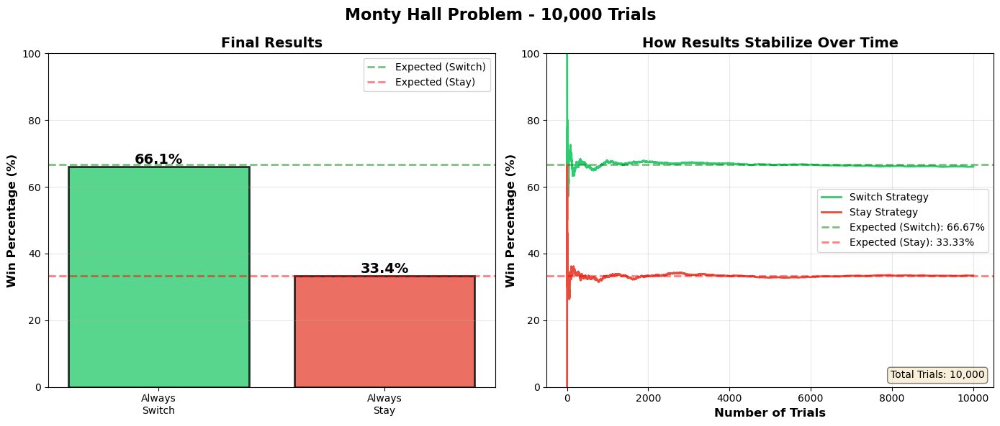

In [3]:
def create_static_visualization(num_trials=10000):
    """
    Create a comprehensive static visualization showing the simulation results.
    """
    sim = MontyHallSimulation()
    sim.run_simulation(num_trials)
    
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))
    fig.suptitle(f'Monty Hall Problem - {num_trials:,} Trials', fontsize=16, fontweight='bold')
    
    # Bar chart comparing final percentages
    strategies = ['Always\nSwitch', 'Always\nStay']
    switch_pct, stay_pct = sim.get_results()
    percentages = [switch_pct, stay_pct]
    colors = ['#2ecc71', '#e74c3c']
    
    bars = ax1.bar(strategies, percentages, color=colors, alpha=0.8, edgecolor='black', linewidth=2)
    ax1.set_ylabel('Win Percentage (%)', fontsize=12, fontweight='bold')
    ax1.set_title('Final Results', fontsize=14, fontweight='bold')
    ax1.set_ylim(0, 100)
    ax1.axhline(y=66.67, color='green', linestyle='--', linewidth=2, alpha=0.5, label='Expected (Switch)')
    ax1.axhline(y=33.33, color='red', linestyle='--', linewidth=2, alpha=0.5, label='Expected (Stay)')
    ax1.legend()
    ax1.grid(axis='y', alpha=0.3)
    
    # Add percentage labels on bars
    for bar, pct in zip(bars, percentages):
        height = bar.get_height()
        ax1.text(bar.get_x() + bar.get_width()/2., height,
                f'{pct:.1f}%',
                ha='center', va='bottom', fontsize=14, fontweight='bold')
    
    # Line chart showing convergence over time
    trials_range = list(range(1, len(sim.switch_history) + 1))
    ax2.plot(trials_range, sim.switch_history, color='#2ecc71', linewidth=2, label='Switch Strategy')
    ax2.plot(trials_range, sim.stay_history, color='#e74c3c', linewidth=2, label='Stay Strategy')
    ax2.axhline(y=66.67, color='green', linestyle='--', linewidth=2, alpha=0.5, label='Expected (Switch): 66.67%')
    ax2.axhline(y=33.33, color='red', linestyle='--', linewidth=2, alpha=0.5, label='Expected (Stay): 33.33%')
    ax2.set_xlabel('Number of Trials', fontsize=12, fontweight='bold')
    ax2.set_ylabel('Win Percentage (%)', fontsize=12, fontweight='bold')
    ax2.set_title('How Results Stabilize Over Time', fontsize=14, fontweight='bold')
    ax2.set_ylim(0, 100)
    ax2.legend(loc='right')
    ax2.grid(True, alpha=0.3)
    
    # Add annotation about sample size
    ax2.text(0.98, 0.02, f'Total Trials: {num_trials:,}', 
             transform=ax2.transAxes, fontsize=10,
             verticalalignment='bottom', horizontalalignment='right',
             bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))
    
    plt.tight_layout()
    plt.show()

# Run the static visualization
create_static_visualization(10000)

## 2. Sample Size Comparison

This section demonstrates the **Law of Large Numbers**. By running the simulation with 100, 1,000, and 10,000 trials, we can see how the results become more accurate and stable as the sample size increases.

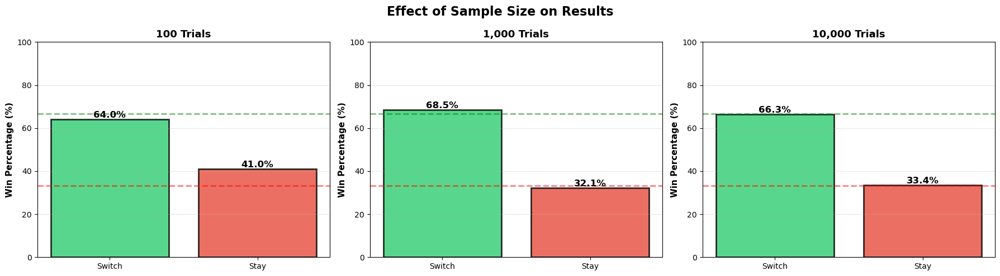

In [4]:
def run_comparison(trial_counts=[100, 1000, 10000]):
    """
    Run simulations with different trial counts to show how results improve.
    """
    fig, axes = plt.subplots(1, len(trial_counts), figsize=(6*len(trial_counts), 5))
    fig.suptitle('Effect of Sample Size on Results', fontsize=16, fontweight='bold')
    
    if len(trial_counts) == 1:
        axes = [axes]
    
    for ax, num_trials in zip(axes, trial_counts):
        sim = MontyHallSimulation()
        sim.run_simulation(num_trials)
        switch_pct, stay_pct = sim.get_results()
        
        strategies = ['Switch', 'Stay']
        percentages = [switch_pct, stay_pct]
        colors = ['#2ecc71', '#e74c3c']
        
        bars = ax.bar(strategies, percentages, color=colors, alpha=0.8, 
                     edgecolor='black', linewidth=2)
        ax.set_ylabel('Win Percentage (%)', fontsize=11, fontweight='bold')
        ax.set_title(f'{num_trials:,} Trials', fontsize=13, fontweight='bold')
        ax.set_ylim(0, 100)
        ax.axhline(y=66.67, color='green', linestyle='--', linewidth=2, alpha=0.5)
        ax.axhline(y=33.33, color='red', linestyle='--', linewidth=2, alpha=0.5)
        ax.grid(axis='y', alpha=0.3)
        
        # Add percentage labels
        for bar, pct in zip(bars, percentages):
            height = bar.get_height()
            ax.text(bar.get_x() + bar.get_width()/2., height,
                   f'{pct:.1f}%',
                   ha='center', va='bottom', fontsize=12, fontweight='bold')
    
    plt.tight_layout()
    plt.show()

# Run the comparison
run_comparison([100, 1000, 10000])

## 3. Animated Visualization

This animation runs the simulation in real-time (well, slightly sped up). It updates the graphs as each batch of trials completes, allowing students to watch the probabilities converge to their expected values.

In [5]:
def create_animated_visualization(target_trials=1000, interval=50):
    """
    Create an animated visualization that updates in real-time.
    """
    sim = MontyHallSimulation()
    
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))
    fig.suptitle('Monty Hall Problem - Live Simulation', fontsize=16, fontweight='bold')
    
    # Setup bar chart
    strategies = ['Switch', 'Stay']
    bars = ax1.bar(strategies, [0, 0], color=['#2ecc71', '#e74c3c'], alpha=0.8, 
                   edgecolor='black', linewidth=2)
    ax1.set_ylabel('Win Percentage (%)', fontsize=12, fontweight='bold')
    ax1.set_title('Current Results', fontsize=14, fontweight='bold')
    ax1.set_ylim(0, 100)
    ax1.axhline(y=66.67, color='green', linestyle='--', linewidth=2, alpha=0.5)
    ax1.axhline(y=33.33, color='red', linestyle='--', linewidth=2, alpha=0.5)
    ax1.grid(axis='y', alpha=0.3)
    
    # Text labels for percentages
    text_labels = [ax1.text(bar.get_x() + bar.get_width()/2., 0, '',
                           ha='center', va='bottom', fontsize=14, fontweight='bold')
                  for bar in bars]
    
    # Setup line chart
    line_switch, = ax2.plot([], [], color='#2ecc71', linewidth=2, label='Switch')
    line_stay, = ax2.plot([], [], color='#e74c3c', linewidth=2, label='Stay')
    ax2.axhline(y=66.67, color='green', linestyle='--', linewidth=2, alpha=0.5, label='Expected (Switch)')
    ax2.axhline(y=33.33, color='red', linestyle='--', linewidth=2, alpha=0.5, label='Expected (Stay)')
    ax2.set_xlabel('Number of Trials', fontsize=12, fontweight='bold')
    ax2.set_ylabel('Win Percentage (%)', fontsize=12, fontweight='bold')
    ax2.set_title('Convergence Over Time', fontsize=14, fontweight='bold')
    ax2.set_xlim(0, target_trials)
    ax2.set_ylim(0, 100)
    ax2.legend()
    ax2.grid(True, alpha=0.3)
    
    trial_text = ax2.text(0.98, 0.02, '', transform=ax2.transAxes, fontsize=10,
                         verticalalignment='bottom', horizontalalignment='right',
                         bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))
    
    def init():
        """Initialize animation"""
        for bar in bars:
            bar.set_height(0)
        for text in text_labels:
            text.set_text('')
        line_switch.set_data([], [])
        line_stay.set_data([], [])
        trial_text.set_text('Trials: 0')
        return list(bars) + text_labels + [line_switch, line_stay, trial_text]
    
    def animate(frame):
        """Update animation for each frame"""
        # Run 10 trials per frame for faster animation
        trials_per_frame = 10
        sim.run_simulation(trials_per_frame)
        
        switch_pct, stay_pct = sim.get_results()
        
        # Update bar chart
        bars[0].set_height(switch_pct)
        bars[1].set_height(stay_pct)
        text_labels[0].set_text(f'{switch_pct:.1f}%')
        text_labels[0].set_y(switch_pct)
        text_labels[1].set_text(f'{stay_pct:.1f}%')
        text_labels[1].set_y(stay_pct)
        
        # Update line chart
        trials_range = list(range(1, len(sim.switch_history) + 1))
        line_switch.set_data(trials_range, sim.switch_history)
        line_stay.set_data(trials_range, sim.stay_history)
        
        trial_text.set_text(f'Trials: {sim.trials:,}')
        
        return list(bars) + text_labels + [line_switch, line_stay, trial_text]
    
    num_frames = target_trials // 10  # 10 trials per frame
    anim = animation.FuncAnimation(fig, animate, init_func=init, 
                                  frames=num_frames, interval=interval, 
                                  blit=True, repeat=False)
    
    plt.close() # Prevent double display
    return anim

# Create and display the animation
anim = create_animated_visualization(target_trials=1000, interval=50)
HTML(anim.to_jshtml())